Vincent Broda

CS522 HW 4

Problem 1

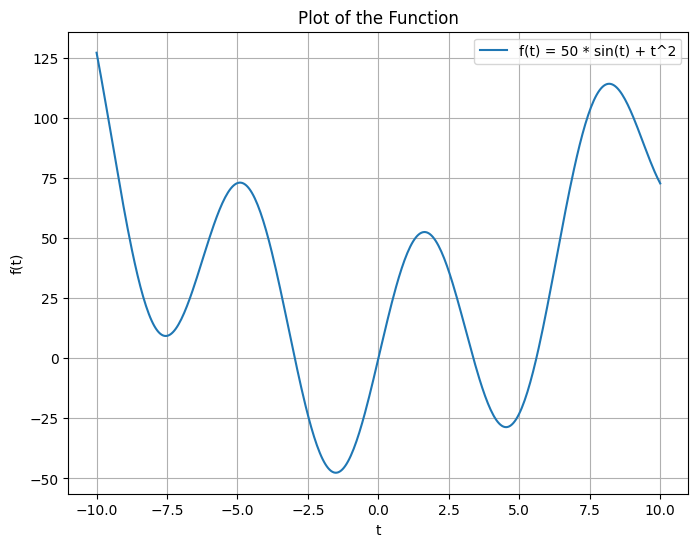

In [ ]:
# a
import numpy as np
import matplotlib.pyplot as plt

# Define the function f(t)
def f(t):
    return 50 * np.sin(t) + t**2

# Generate t values in the range [-10, 10]
t = np.linspace(-10, 10, 400)
# Calculate corresponding f(t) values
ft = f(t)

# Plot the function
plt.figure(figsize=(8, 6))
plt.plot(t, ft, label='f(t) = 50 * sin(t) + t^2')
plt.xlabel('t')
plt.ylabel('f(t)')
plt.title('Plot of the Function')
plt.grid(True)
plt.legend()
plt.show()


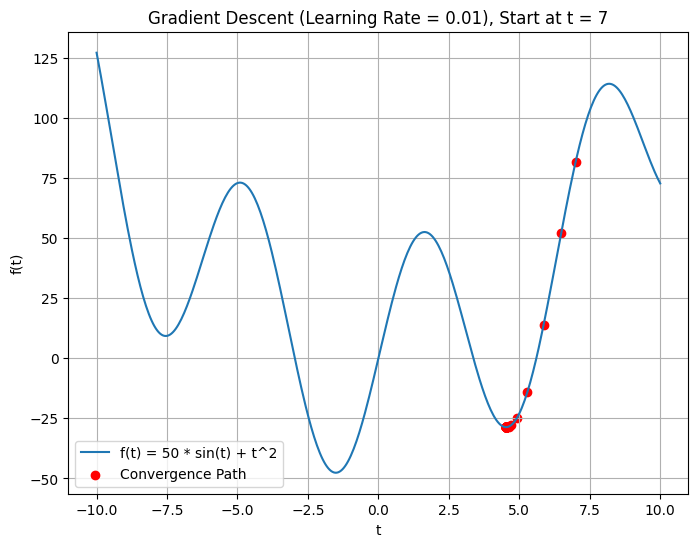

Local Minimum: 4.5301753356394485


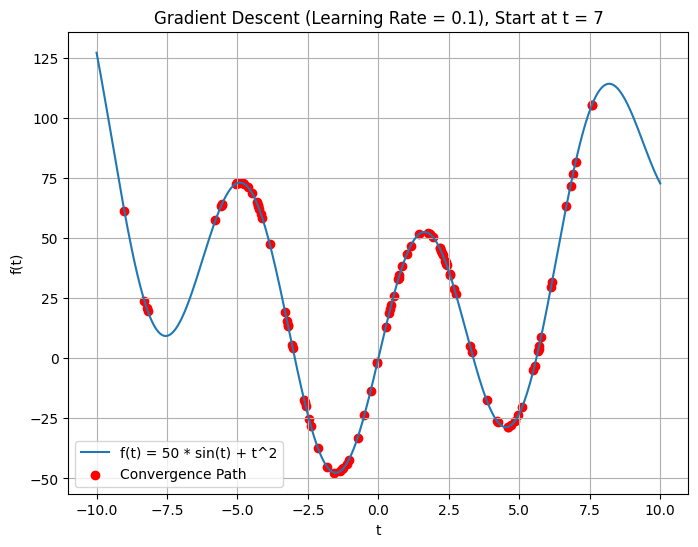

Local Minimum: 7.571101494169402


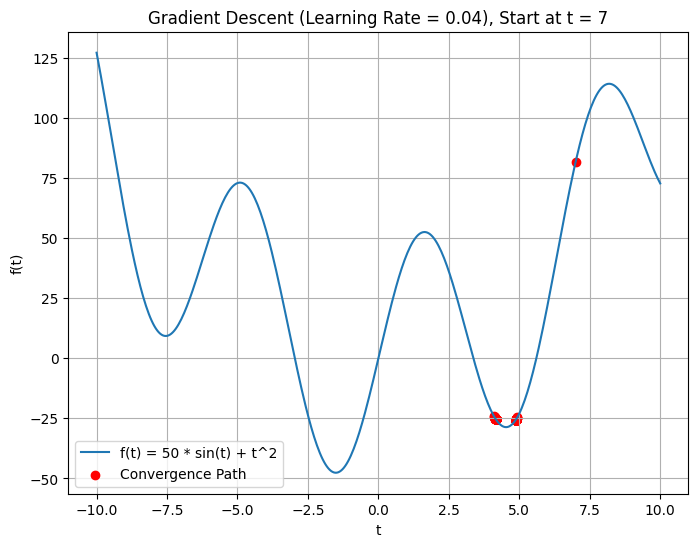

Local Minimum: 4.157057952911842


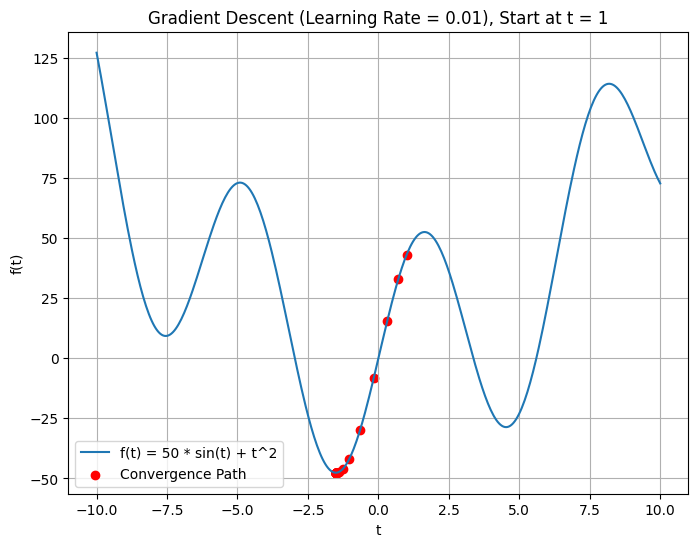

Local Minimum: -1.5103456887166398


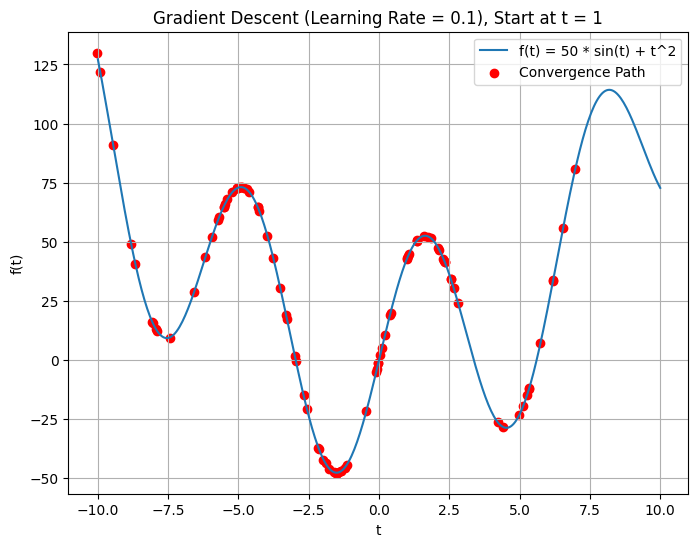

Local Minimum: 5.741461346140659


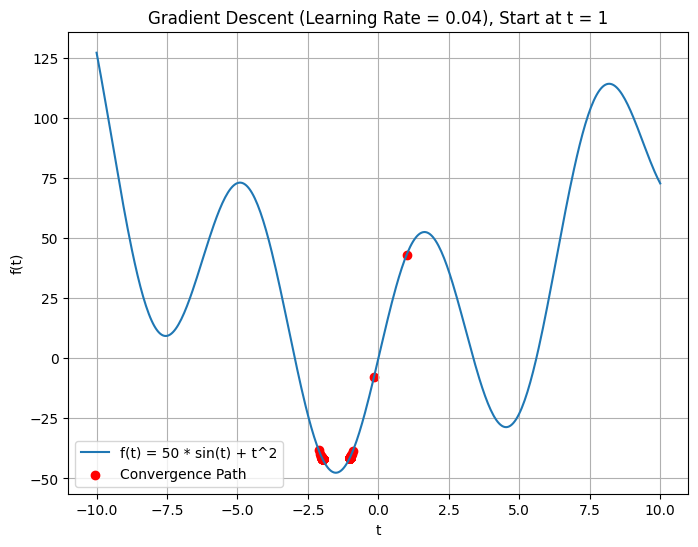

Local Minimum: -1.9819127209707021


In [ ]:
# b
def f_prime(t):
    return 50 * np.cos(t) + 2 * t

# Gradient Descent function
def gradient_descent(start_t, learning_rate, num_iterations):
    t_values = [start_t]
    for _ in range(num_iterations):
        current_t = t_values[-1]
        gradient = f_prime(current_t)
        new_t = current_t - learning_rate * gradient
        t_values.append(new_t)
    return t_values

# Ploting the points of the convergence path
def plot_convergence_path(start_t, learning_rate, num_iterations):
    # use function and store values
    t_values = gradient_descent(start_t, learning_rate, num_iterations)
    ft_values = [f(t) for t in t_values]

    t = np.linspace(-10, 10, 400)
    ft = f(t)

    plt.figure(figsize=(8, 6))
    plt.plot(t, ft, label='f(t) = 50 * sin(t) + t^2')

    # Ploting the convergence path
    plt.scatter(t_values, ft_values, c='red', label='Convergence Path', marker='o')

    plt.xlabel('t')
    plt.ylabel('f(t)')
    plt.title(f'Gradient Descent (Learning Rate = {learning_rate}), Start at t = {start_t}')
    plt.grid(True)
    plt.legend()
    plt.show()

    # printing the minumum
    final_t = t_values[-1]
    print(f'Local Minimum: {final_t}')

# Experiment 1: Starting at t=7, trying to have every version of the learning rate besides having it perfect
plot_convergence_path(start_t=7, learning_rate=0.01, num_iterations=100)
plot_convergence_path(start_t=7, learning_rate=0.1, num_iterations=100)
plot_convergence_path(start_t=7, learning_rate=0.04, num_iterations=1000)


# Experiment 2: Starting at t=1, same idea for learning rate
plot_convergence_path(start_t=1, learning_rate=0.01, num_iterations=100)
plot_convergence_path(start_t=1, learning_rate=0.1, num_iterations=100)
plot_convergence_path(start_t=1, learning_rate=0.04, num_iterations=1000)


Local Min for k = 7: -1.5103456887166398

Local Min for k = 1: 7.571101494169402

For the results, I have ran the gradient desent, of the asked for places, where it will show off how it gets te local min. I have also run each 3 times with 3 different learning rates. The first is a learning rate that is less than the optimal one as seen by its gradual but direct path the the minimumn. The next is a rate that is over 2 times bigger than the optimal learning rate. This can be seen as it does not comverge and goes crazy. The last is a learning rate that is between the optimal learning rate and still less than t time the optimal learning rate. This can be seen as it bounces between being lower and higher the the local minimumn while it is converging.
It is worth noting that in my learning rate = 0.04 examples, we do not see it converge completely. This can be fixed easily by lowering the learning rate more, as a lower learning rate is better in the sence you know it will converge. We can also change the number of itterations, but this does not help nearly as much.

Problem 2

I also uploaded all of part a as a seperate pdf on canvas in case the picture is not clear here.

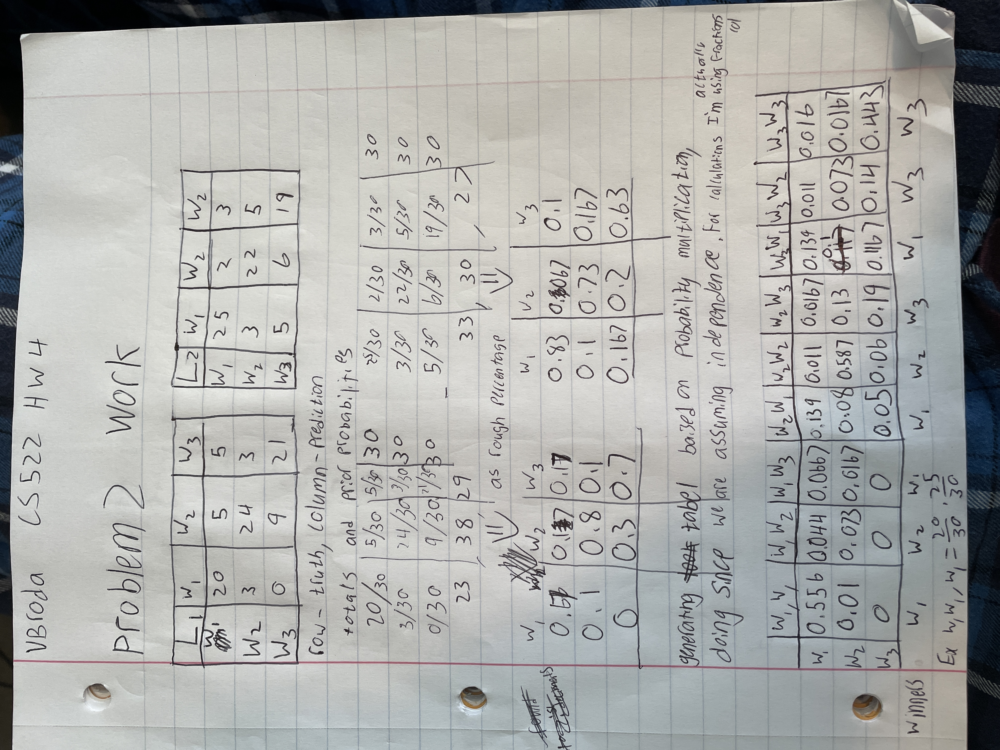

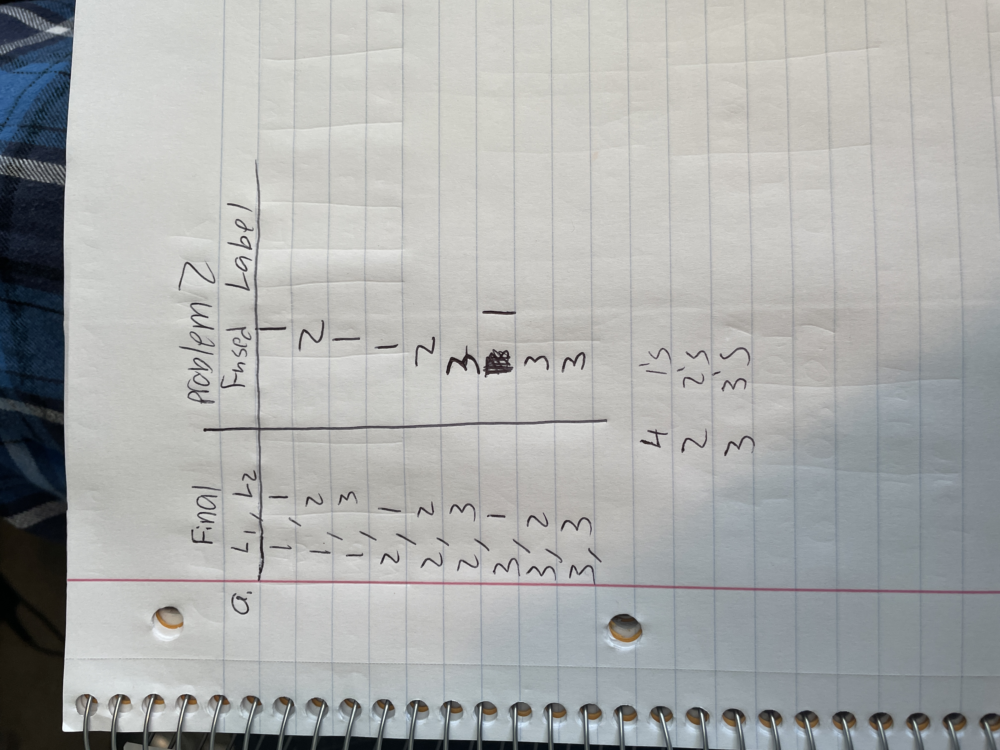

b. We can generate the look up tabel for using Naive Baysian because we are assuming independence. BKS does not make this assumption, and is their for a bit more compicated. I belive that this means you would probably also need the prior probaility of the classes in the data set, however I am not sure if this is actully the case from what I remember from class and see on the powerpoint/my notes.
To actually make the look up tabel for BKS, you will set it up similar to the Naive Baysian, however instead of doing the probability multiplication, you will just look at the number of samples from each class for each classifier. Then you will pick the one with the most samples. If they are tied, you can just randomly pick between the two.

Problem 3

Downloaded datasets from https://www.stats.ox.ac.uk/pub/PRNN/


In [ ]:
import numpy as np

def load_data(f):
  data = np.genfromtxt(f, dtype=str, skip_header=1)
  # just doing stuff to make sure the data set is read in properly, since last column is yes and no
  X = data[:, :-1]
  X = X.astype(float)
  y = (data[:, -1] == 'Yes').astype(int)

  return X, y

In [ ]:
def normalize(Tr, Te):
  trMean = np.mean(Tr, axis = 0)
  trStd = np.std(Tr, axis = 0)
  Tr = (Tr - trMean) / trStd
  Te = (Te - trMean) / trStd

  return Tr, Te

In [ ]:
def calculate_tpr_fpr(y_test, y_pred):
  # Calculate the number of true positives, false positives, and true negatives based on predictions
  TP = sum((y_test == 1) & (y_pred == 1))
  FP = sum((y_test == 0) & (y_pred == 1))
  TN = sum((y_test == 0) & (y_pred == 0))

  # Calculate the number of actual positives and negatives
  P = sum(y_test == 1)
  N = sum(y_test == 0)

  # Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
  tpr = TP / P  # Sensitivity
  fpr = FP / N  # 1 - Specificity

  return tpr, fpr

In [ ]:
# mpp class that will be tested, from earlier assignments
class mpp:
    """Maximum Posterior Probability
    Supervised parametric learning assuming Gaussian pdf
    with 3 cases of discriminant functions. Cases should be 1, 2, or 3.
    """
    def __init__(self, case):
        self.case_ = case

    def fit(self, Tr, y):
        # derive the model
        self.covs_, self.means_ = {}, {}     # dictionaries
        self.classes_ = np.unique(y)         # get unique labels as dictionary items
        self.classn_ = len(self.classes_)    # the number of classes in the dataset
        self.dimension_ = np.shape(Tr)[1]

        self.covsum_ = 0
        for c in self.classes_:
            arr = Tr[y == c]
            self.covs_[c] = np.cov(np.transpose(arr))
            self.means_[c] = np.mean(arr, axis=0)  # mean along rows
            self.covsum_ += self.covs_[c]

        # used by case II
        self.covavg_ = self.covsum_ / self.classn_

        # used by case I
        self.varavg_ = np.sum(np.diagonal(self.covavg_)) / self.dimension_

    def predict(self, Te, prior):
        # predict labels of all test data
        disc = np.zeros(self.classn_)
        nr, _ = Te.shape
        y = np.zeros(nr)         # array to hold the predicted label

        for i in range(nr):         # going through each sample (or each row of the test set)
            for c in self.classes_:  # going through each class or category
                if self.case_ == 1:
                    edist2 = np.dot(Te[i]-self.means_[c], Te[i]-self.means_[c])
                    disc[c] = -edist2 / (2 * self.varavg_) + np.log(prior[c])
                elif self.case_ == 2:
                    diff = Te[i] - self.means_[c]
                    mdist2 = np.dot(np.dot(diff, np.linalg.inv(self.covavg_)), diff)
                    disc[c] = -mdist2 / 2 + np.log(prior[c])
                elif self.case_ == 3:
                    diff = Te[i] - self.means_[c]
                    mdist2 = np.dot(np.dot(diff, np.linalg.inv(self.covs_[c])), diff)
                    disc[c] = -mdist2 / 2 - np.log(np.linalg.det(self.covs_[c])) / 2 + np.log(prior[c])
                else:
                    print("Can only handle case numbers 1, 2, 3.")
            y[i] = disc.argmax() # note that I did not use randomness in the tie situation

        return y

In [ ]:
import random

# setting some data for the next few cells to use
Xtrain, ytrain = load_data('/content/pima.tr')
Xtest, ytest = load_data('/content/pima.te')

Xtrain, Xtest = normalize(Xtrain, Xtest)

num_iterations = 20


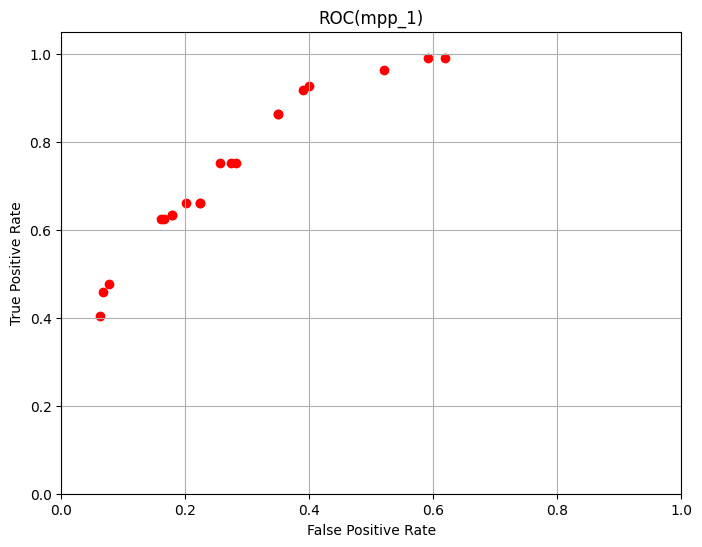

In [ ]:
# For MPP1, eucludian distance
tpr1_values = []
fpr1_values = []

for _ in range(num_iterations):
    # Generate random prior probabilities
    prior_probabilities = {0: random.uniform(0, 1), 1: random.uniform(0, 1)}

    # Create an instance of the mpp classifier that will be used
    mpp_classifier = mpp(1)
    mpp_classifier.fit(Xtrain, ytrain)
    y_pred = mpp_classifier.predict(Xtest, prior_probabilities)

    # Calculate true positive  and false negative rates for the current iteration
    tpr, fpr = calculate_tpr_fpr(ytest, y_pred)

    # Append TPR and FPR to the lists that will be ploted
    tpr1_values.append(tpr)
    fpr1_values.append(fpr)

# Plot all the TPR and FPR values
plt.figure(figsize=(8, 6))
for i in range(num_iterations):
    plt.scatter(fpr1_values[i], tpr1_values[i], marker='o', c='red')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC(mpp_1)')
plt.grid(True)
plt.show()

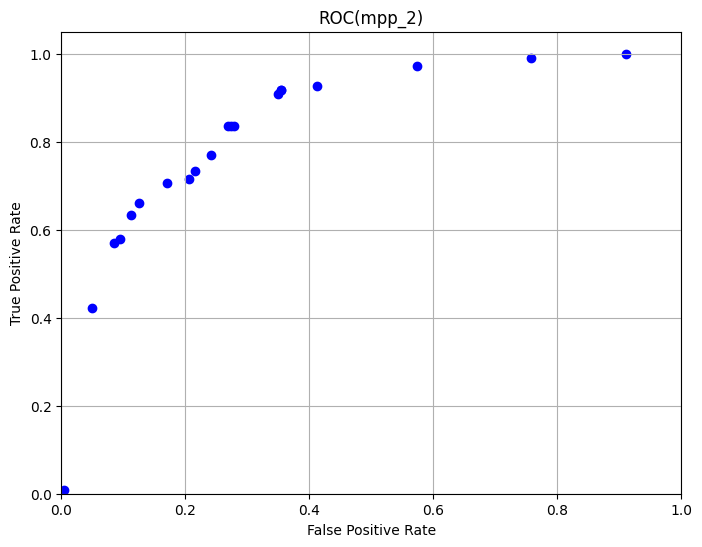

In [ ]:
# same thing
tpr2_values = []
fpr2_values = []

for _ in range(num_iterations):
    prior_probabilities = {0: random.uniform(0, 1), 1: random.uniform(0, 1)}

    mpp_classifier = mpp(2)
    mpp_classifier.fit(Xtrain, ytrain)
    y_pred = mpp_classifier.predict(Xtest, prior_probabilities)

    tpr, fpr = calculate_tpr_fpr(ytest, y_pred)

    tpr2_values.append(tpr)
    fpr2_values.append(fpr)

plt.figure(figsize=(8, 6))
for i in range(num_iterations):
    plt.scatter(fpr2_values[i], tpr2_values[i], marker='o', c='blue')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC(mpp_2)')
plt.grid(True)
plt.show()

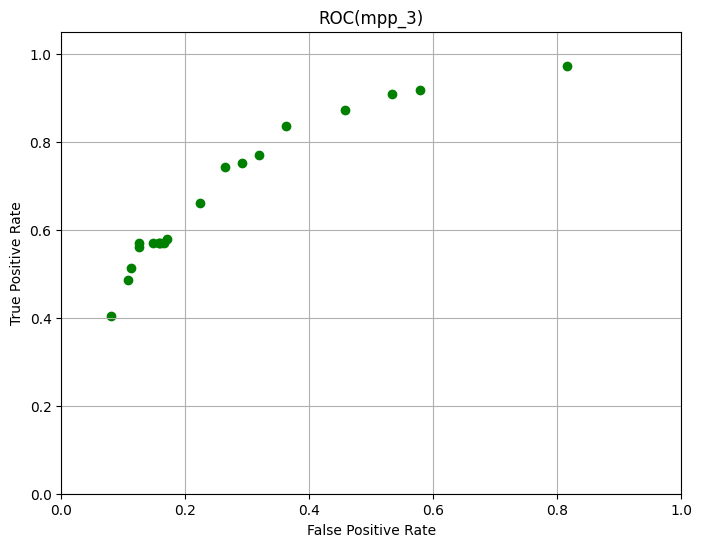

In [ ]:
# same thing again
tpr3_values = []
fpr3_values = []

for _ in range(num_iterations):
    prior_probabilities = {0: random.uniform(0, 1), 1: random.uniform(0, 1)}

    mpp_classifier = mpp(3)
    mpp_classifier.fit(Xtrain, ytrain)
    y_pred = mpp_classifier.predict(Xtest, prior_probabilities)

    tpr, fpr = calculate_tpr_fpr(ytest, y_pred)

    tpr3_values.append(tpr)
    fpr3_values.append(fpr)

plt.figure(figsize=(8, 6))
for i in range(num_iterations):
    plt.scatter(fpr3_values[i], tpr3_values[i], marker='o', c='green')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC(mpp_3)')
plt.grid(True)
plt.show()

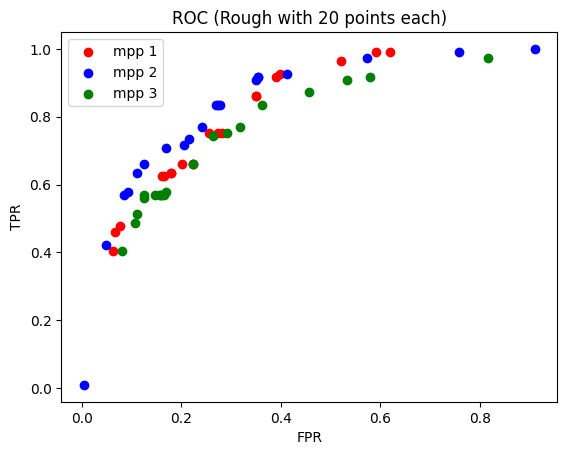

In [ ]:
# Now all on same one
fig, ax = plt.subplots()

ax.scatter(fpr1_values, tpr1_values, label='mpp 1', color='red', marker='o')
ax.scatter(fpr2_values, tpr2_values, label='mpp 2', color='blue', marker='o')
ax.scatter(fpr3_values, tpr3_values, label='mpp 3', color='green', marker='o')

ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax.set_title('ROC (Rough with 20 points each)')
ax.legend()

plt.show()